## Import Modules

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

warnings.filterwarnings('ignore')

2024-06-17 17:52:06.825962: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-17 17:52:06.826071: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-17 17:52:06.959981: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Load the files from kaggle 50k-celebrity-faces-image-dataset of 50k human faces

In [2]:
BASE_DIR = '/kaggle/input/50k-celebrity-faces-image-dataset/Celebrity_Faces_Dataset'

In [3]:

image_paths = []
for image_name in os.listdir(BASE_DIR):
    image_path = os.path.join(BASE_DIR, image_name)
    image_paths.append(image_path)

In [4]:
len(image_paths)

50000

## Visualize the Image

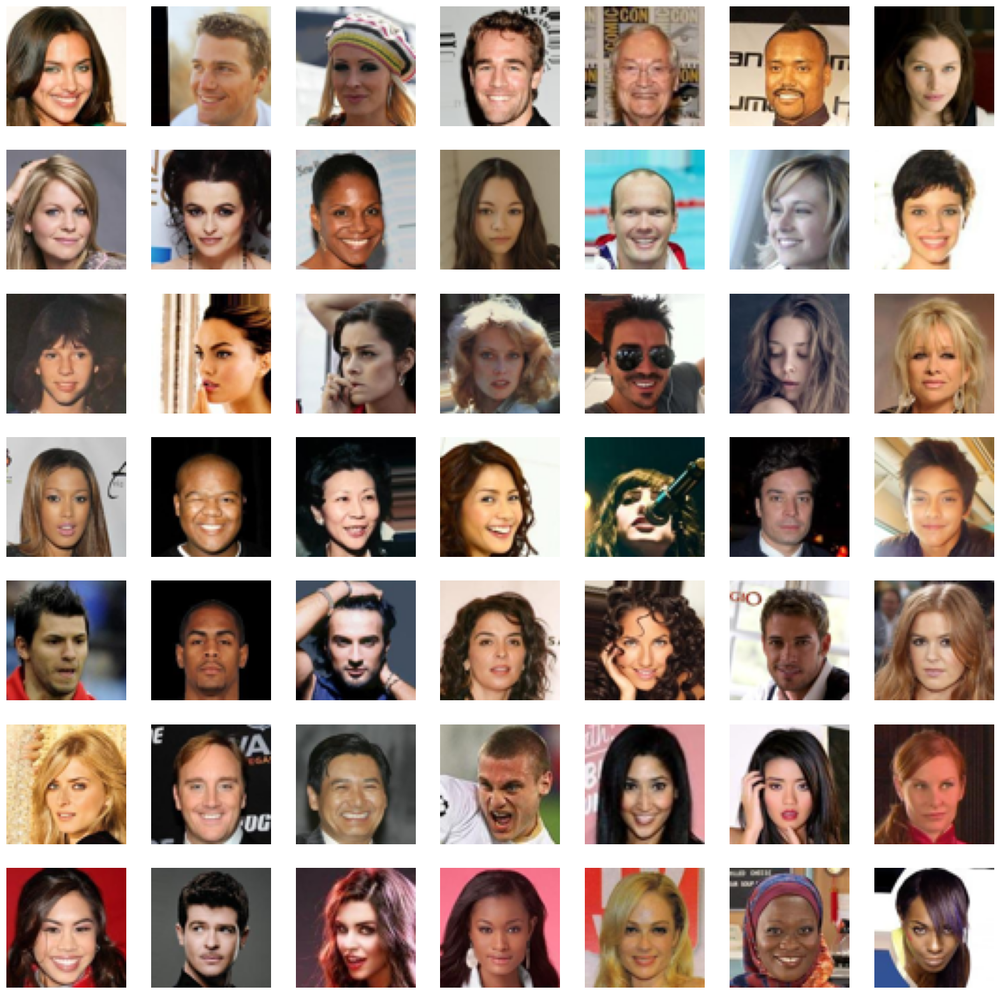

In [5]:
plt.figure(figsize=(20, 20))
temp_images = image_paths[:49]
index = 1

for image_path in temp_images:
    plt.subplot(7, 7, index)
    img = Image.open(image_path)
    img = img.crop((0, 20, 178, 198))
    img = img.resize((64, 64))
    img = np.array(img)
    plt.imshow(img)
    plt.axis('off')
    index += 1

## Preprocess Images like loading ,croping ,normalizing

In [6]:
def load_and_preprocess_real_images(image_path, target_size=(64, 64)):
    img = Image.open(image_path)
    img = img.crop((0, 20, 178, 198))
    img = img.resize(target_size)
    img = (np.array(img)-127.5)/127.5
    return img

In [7]:

train_images = [load_and_preprocess_real_images(path) for path in tqdm(image_paths)]
train_images = np.array(train_images)

  0%|          | 0/50000 [00:00<?, ?it/s]

### Define Constants for Model Configuration

1. **LATENT_DIM**: This constant defines the dimensionality of the latent space, which is set to 200. The latent space is typically used in generative models like GANs (Generative Adversarial Networks)

2. **WEIGHT_INIT**: This constant specifies the weight initialization method for the neural network layers. Here, the weights are initialized using a normal distribution with a mean of 0.0 and a standard deviation of 0.02. This type of initialization is often used to stabilize the training of deep neural networks.

3. **CHANNELS**: This constant defines the number of channels in the input data. For example, in the case of RGB images, the number of channels is 3


In [8]:

LATENT_DIM = 200

WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

CHANNELS = 3 

### Define the Generator Model

This section defines a generator model using the `Sequential` API from Keras. The model is designed to generate images from random noise.

In [9]:
model = Sequential(name='generator1')

model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
model.add(layers.ReLU())

model.add(layers.Reshape((8, 8, 512)))

model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator1 = model
generator1.summary()

Model: "generator1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     6,586,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,416 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_2 (ReLU)                  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,136 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_3 (ReLU)                  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         3,075 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,342,403 (35.64 MB)

 Trainable params: 9,342,403 (35.64 MB)

 Non-trainable params: 0 (0.00 B)


### Define the Discriminator Model

This section defines a discriminator model using the `Sequential` API from Keras. The model is designed to classify images as real or fake.

In [10]:
model = Sequential(name='discriminator1')
input_shape = (64, 64, 3)
alpha = 0.2

model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

model.add(layers.Dense(1, activation='sigmoid'))

discriminator1 = model
discriminator1.summary()

Model: "discriminator1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 8, 8, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

### Define the Second Generator Model

This section defines a second generator model using the `Sequential` API from Keras. The model is designed to generate images from random noise, with additional convolutional layers compared to the first generator.

In [11]:
model = Sequential(name='generator2')

model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
model.add(layers.ReLU())

model.add(layers.Reshape((8, 8, 512)))

model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(1, 1), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())
model.add(layers.Conv2DTranspose(156, (4, 4), strides=(1,1), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
model.add(layers.ReLU())

model.add(layers.Conv2DTranspose(128, (4, 4), strides=(1, 1), padding='same', kernel_initializer=WEIGHT_INIT))

model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator2 = model
generator2.summary()

Model: "generator2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                 │ (None, 32768)          │     6,586,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 256)    │     2,097,408 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 16, 16, 256)    │     1,048,832 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_6 (ReLU)                  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 32, 32, 256)    │     1,048,832 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_7 (ReLU)                  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 32, 32, 156)    │       639,132 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_8 (ReLU)                  │ (None, 32, 32, 156)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 64, 64, 128)    │       319,616 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_9 (ReLU)                  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_8              │ (None, 64, 64, 128)    │       262,272 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_10 (ReLU)                 │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 64, 64, 3)      │         6,147 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,008,607 (45.81 MB)

 Trainable params: 12,008,607 (45.81 MB)

 Non-trainable params: 0 (0.00 B)

### Define the Second Discriminator Model

This section defines a second discriminator model using the `Sequential` API from Keras. The model is designed to classify images as real or fake, with additional convolutional layers compared to the first discriminator.

In [12]:
model = Sequential(name='discriminator2')
input_shape = (64, 64, 3)
alpha = 0.2


model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))
model.add(layers.Conv2D(64, (4, 4), strides=(1, 1), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))


model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(64, (4, 4), strides=(1, 1), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))


model.add(layers.Dense(1, activation='sigmoid'))

discriminator2 = model
discriminator2.summary()

Model: "discriminator2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 32, 32, 128)    │         6,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 16, 16, 128)    │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 64)     │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 8, 8, 64)       │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 8, 8, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 8, 8, 64)       │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 8, 8, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         4,097 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 536,769 (2.05 MB)

 Trainable params: 535,873 (2.04 MB)

 Non-trainable params: 896 (3.50 KB)

### Define the DCGAN Model Class

This class implements a DCGAN model, including generator and discriminator models, custom training steps, and loss tracking. It supports compilation with optimizers and a loss function, and uses gradient tapes for backpropagation during training

In [13]:
class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')
        
    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]
    
    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        
        batch_size = tf.shape(real_images)[0]
  
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))
        
        
        with tf.GradientTape() as tape:
          
            pred_real = self.discriminator(real_images, training=True)
          
            real_labels = tf.ones((batch_size, 1))
        
            d_loss_real = self.loss_fn(real_labels, pred_real)
        
          
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
      
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)
            
         
            d_loss = d_loss_real + d_loss_fake
            
     
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
       
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))
        
        
        
        labels = tf.ones((batch_size, 1))
       
        with tf.GradientTape() as tape:
          
            fake_images = self.generator(random_noise, training=True)
         
            pred_fake = self.discriminator(fake_images, training=True)
           
            g_loss = self.loss_fn(labels, pred_fake)
            
      
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)

        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))
        
    
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        
        
        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}
    

        

### Define the DCGAN Monitor Callback

This callback monitors the training process of the DCGAN model, saving generated images and tracking loss values. It generates images at the end of each epoch and plots the discriminator and generator losses at the end of training.


In [14]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=200):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
     
        self.noise = tf.random.normal([25, latent_dim])
        self.d_losses = []
        self.g_losses = []
        self.d_losses_all=[]
        self.g_losses_all=[]
        self.total_loss = []
    

        
    def on_epoch_end(self, epoch, logs=None):
     
        g_img = self.model.generator(self.noise)
      
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()
        self.d_losses.append(logs['d_loss'])
        self.g_losses.append(logs['g_loss'])
        self.total_loss.append(logs['d_loss']+logs['g_loss'])
        

        if (epoch)%10 == 0:
            fig = plt.figure(figsize=(8, 8))
            for i in range(25):
                plt.subplot(5, 5, i+1)
                img = array_to_img(g_img[i])
                plt.imshow(img)
                plt.axis('off')
            plt.show()
        
    def on_train_end(self, logs=None):
        plt.figure(figsize=(10, 5))
        plt.plot(self.d_losses, label='Discriminator Loss')
        plt.plot(self.g_losses, label='Generator Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.title('Discriminator and Generator Losses')
        plt.show()
        print(f"minimum value of d_loss = {min(self.d_losses)} for epoch  {self.d_losses.index(min(self.d_losses))}   ")
        print(f"minimum value of g_loss = {min(self.g_losses)} for epoch  {self.g_losses.index(min(self.g_losses))}   ")
        print(f"minimum value of total = {min(self.total_loss)} for epoch  {self.total_loss.index(min(self.total_loss))}   ")
        self.model.generator.save('generator_final.h5')

### DCGAN Initialization

The `dcgan` and `dcgan2` model is initialized with `generator1` and `generator2` for image generation, `discriminator1` and `discriminator2` for image classification respectively, and a latent dimension of `LATENT_DIM` for random noise input.


In [15]:
dcgan = DCGAN(generator=generator1, discriminator=discriminator1, latent_dim=LATENT_DIM)

In [16]:
dcgan2 = DCGAN(generator=generator2, discriminator=discriminator2, latent_dim=LATENT_DIM)

### Compile DCGAN Model

The `dcgan` model is compiled with Adam optimizers for the generator and discriminator (`G_LR` and `D_LR` learning rates, `beta_1=0.5`) and BinaryCrossentropy loss function.


In [17]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

In [18]:
D_LR = 0.0001
G_LR = 0.0003
dcgan2.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

### Train DCGAN Model

The `dcgan` model is trained for `N_EPOCHS` epochs using `train_images` data, with `DCGANMonitor` callback to visualize generated images and monitor losses during training.


Epoch 1/50
   5/1563 ━━━━━━━━━━━━━━━━━━━━ 47s 30ms/step - d_loss: 2.3296 - g_loss: 0.6535

I0000 00:00:1718647148.171929      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1718647148.194784      74 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - d_loss: 1.8600 - g_loss: 2.4383

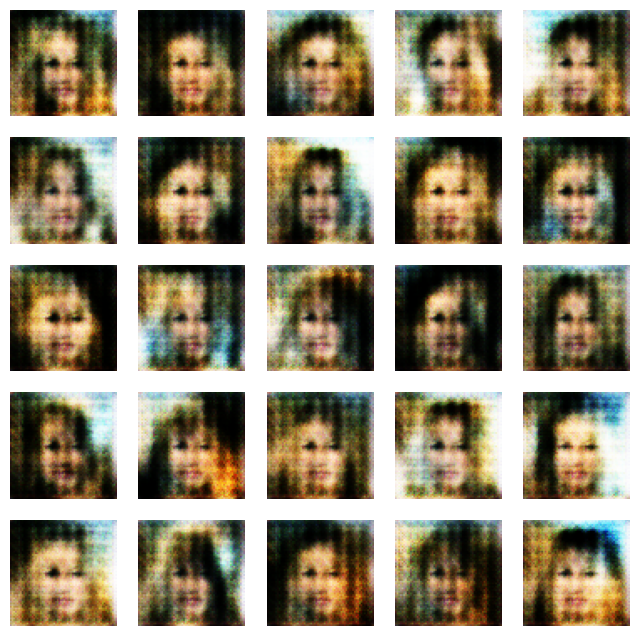

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 77s 38ms/step - d_loss: 1.8596 - g_loss: 2.4383
Epoch 2/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1241 - g_loss: 1.4399
Epoch 3/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2715 - g_loss: 1.2816
Epoch 4/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4415 - g_loss: 0.9326
Epoch 5/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4390 - g_loss: 0.8252
Epoch 6/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - d_loss: 1.4216 - g_loss: 0.7985
Epoch 7/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4193 - g_loss: 0.7708
Epoch 8/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4158 - g_loss: 0.7562
Epoch 9/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4110 - g_loss: 0.7468
Epoch 10/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4062 - g_loss: 0.7456
Epoch 11/50
1561/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.4037 - g_loss: 0.7402

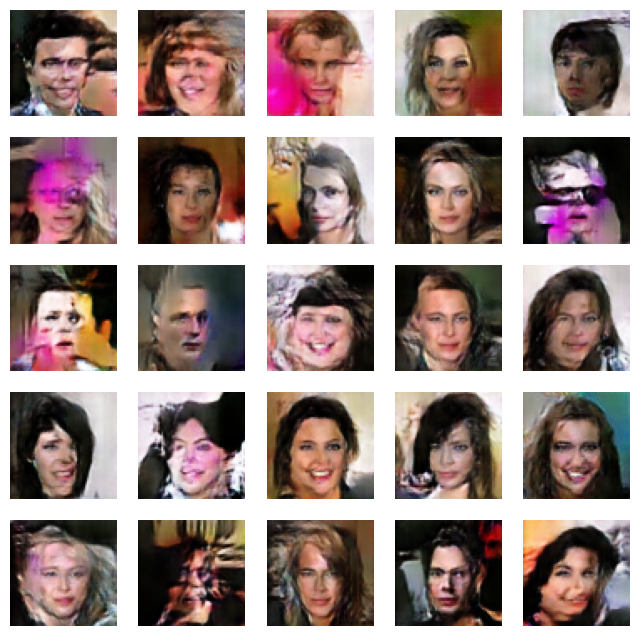

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - d_loss: 1.4037 - g_loss: 0.7402
Epoch 12/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.4010 - g_loss: 0.7371
Epoch 13/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3999 - g_loss: 0.7364
Epoch 14/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3965 - g_loss: 0.7374
Epoch 15/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3976 - g_loss: 0.7364
Epoch 16/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3937 - g_loss: 0.7403
Epoch 17/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3905 - g_loss: 0.7423
Epoch 18/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 82s 29ms/step - d_loss: 1.3885 - g_loss: 0.7414
Epoch 19/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3894 - g_loss: 0.7411
Epoch 20/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3848 - g_loss: 0.7481
Epoch 21/50
1561/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.3855 - g_loss: 0.7456

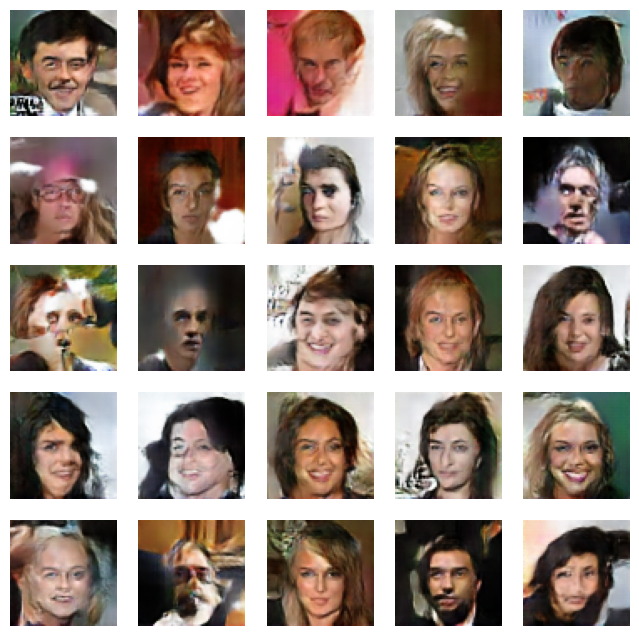

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 46s 30ms/step - d_loss: 1.3855 - g_loss: 0.7456
Epoch 22/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3820 - g_loss: 0.7492
Epoch 23/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3791 - g_loss: 0.7533
Epoch 24/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3767 - g_loss: 0.7556
Epoch 25/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3739 - g_loss: 0.7585
Epoch 26/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3741 - g_loss: 0.7647
Epoch 27/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3668 - g_loss: 0.7732
Epoch 28/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3625 - g_loss: 0.7830
Epoch 29/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3586 - g_loss: 0.7864
Epoch 30/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3543 - g_loss: 0.7996
Epoch 31/50
1561/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.3478 - g_loss: 0.8095

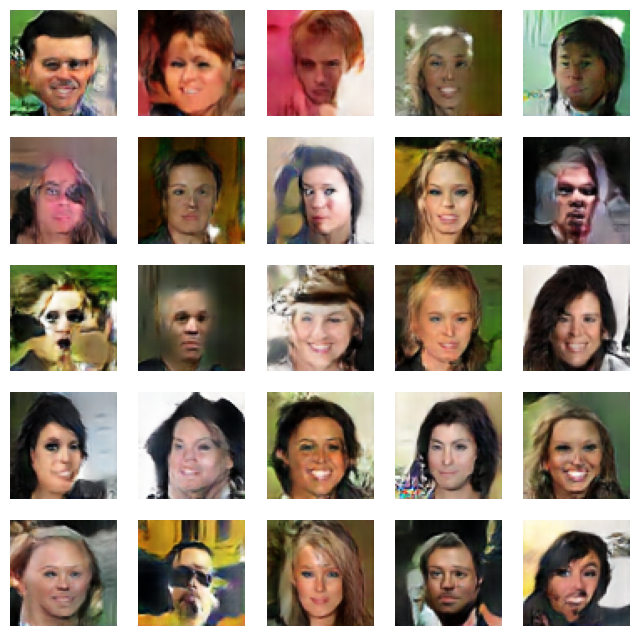

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - d_loss: 1.3478 - g_loss: 0.8095
Epoch 32/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3360 - g_loss: 0.8264
Epoch 33/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3291 - g_loss: 0.8415
Epoch 34/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3205 - g_loss: 0.8585
Epoch 35/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.3070 - g_loss: 0.8756
Epoch 36/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2975 - g_loss: 0.8965
Epoch 37/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2818 - g_loss: 0.9226
Epoch 38/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2720 - g_loss: 0.9516
Epoch 39/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2509 - g_loss: 0.9812
Epoch 40/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 82s 29ms/step - d_loss: 1.2326 - g_loss: 1.0126
Epoch 41/50
1561/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - d_loss: 1.2168 - g_loss: 1.0437

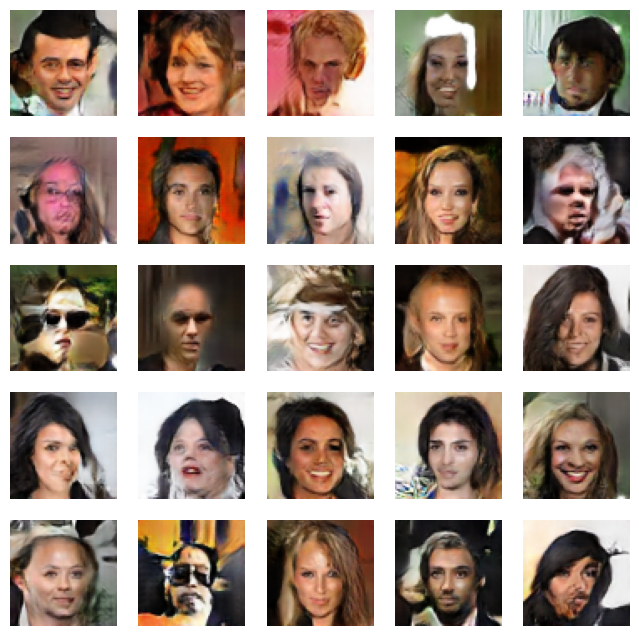

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 46s 29ms/step - d_loss: 1.2168 - g_loss: 1.0437
Epoch 42/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.2070 - g_loss: 1.0681
Epoch 43/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1841 - g_loss: 1.1022
Epoch 44/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1787 - g_loss: 1.1412
Epoch 45/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1627 - g_loss: 1.1679
Epoch 46/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1435 - g_loss: 1.2033
Epoch 47/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1371 - g_loss: 1.2283
Epoch 48/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1187 - g_loss: 1.2710
Epoch 49/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.1071 - g_loss: 1.2996
Epoch 50/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 45s 29ms/step - d_loss: 1.0970 - g_loss: 1.3307


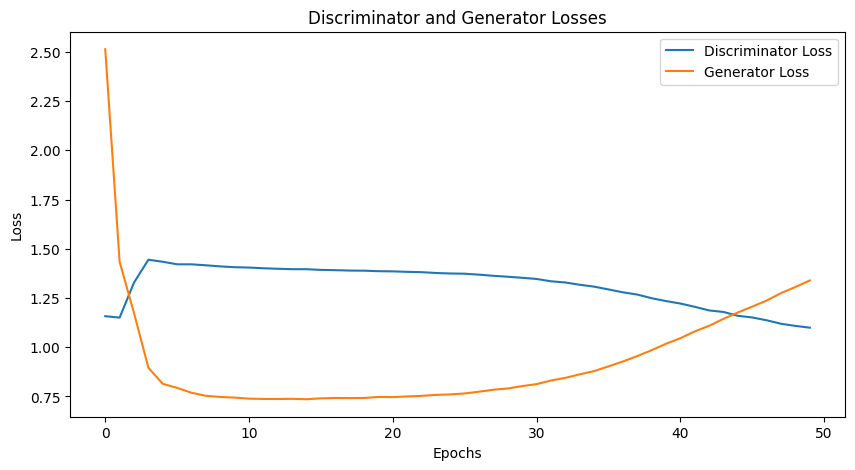

minimum value of d_loss = 1.099036693572998 for epoch  49   
minimum value of g_loss = 0.7358095645904541 for epoch  14   
minimum value of total = 2.130660891532898 for epoch  17   


In [19]:
N_EPOCHS = 50
dcgan.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor(DCGAN)])

Epoch 1/50
   2/1563 ━━━━━━━━━━━━━━━━━━━━ 2:23 92ms/step - d_loss: 2.0665 - g_loss: 1.0457   

W0000 00:00:1718649540.017232      73 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - d_loss: 2.5843 - g_loss: 1.1827

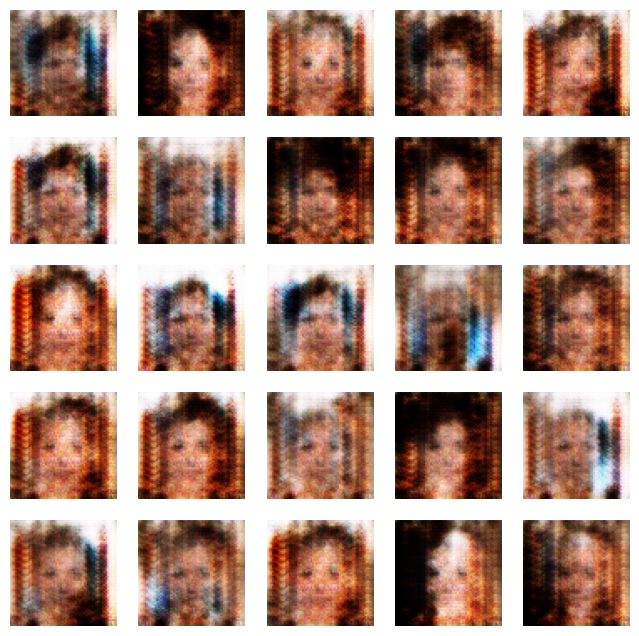

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 188s 102ms/step - d_loss: 2.5838 - g_loss: 1.1827
Epoch 2/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.4487 - g_loss: 0.8069
Epoch 3/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.4332 - g_loss: 0.7721
Epoch 4/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.4249 - g_loss: 0.7398
Epoch 5/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.4103 - g_loss: 0.7455
Epoch 6/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 92ms/step - d_loss: 1.4048 - g_loss: 0.7436
Epoch 7/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 92ms/step - d_loss: 1.3998 - g_loss: 0.7422
Epoch 8/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 92ms/step - d_loss: 1.3956 - g_loss: 0.7548
Epoch 9/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 144s 92ms/step - d_loss: 1.3934 - g_loss: 0.7503
Epoch 10/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 92ms/step - d_loss: 1.3861 - g_loss: 0.7542
Epoch 11/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - d_loss: 1.3916 - g_loss: 0.7362

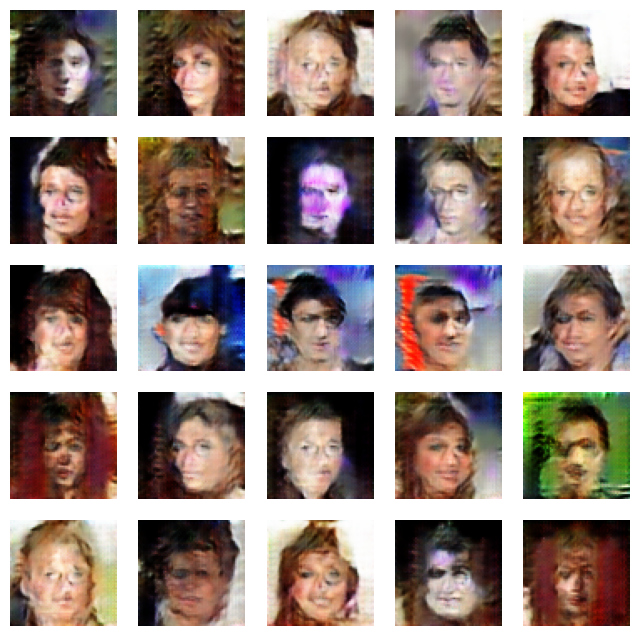

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 145s 93ms/step - d_loss: 1.3916 - g_loss: 0.7363
Epoch 12/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3833 - g_loss: 0.7507
Epoch 13/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 91ms/step - d_loss: 1.3911 - g_loss: 0.7370
Epoch 14/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3918 - g_loss: 0.7308
Epoch 15/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3943 - g_loss: 0.7246
Epoch 16/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3808 - g_loss: 0.7548
Epoch 17/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3867 - g_loss: 0.7374
Epoch 18/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 91ms/step - d_loss: 1.3910 - g_loss: 0.7252
Epoch 19/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3919 - g_loss: 0.7213
Epoch 20/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3894 - g_loss: 0.7271
Epoch 21/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - d_loss: 1.3896 - g_loss: 0.7261

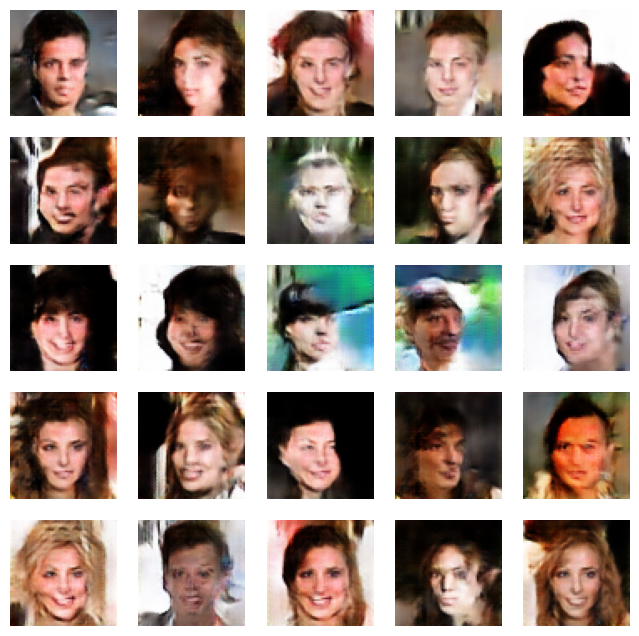

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 91ms/step - d_loss: 1.3896 - g_loss: 0.7261
Epoch 22/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3869 - g_loss: 0.7302
Epoch 23/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3851 - g_loss: 0.7301
Epoch 24/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3729 - g_loss: 0.7591
Epoch 25/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3809 - g_loss: 0.7403
Epoch 26/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3809 - g_loss: 0.7430
Epoch 27/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3756 - g_loss: 0.7530
Epoch 28/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3806 - g_loss: 0.7494
Epoch 29/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3592 - g_loss: 0.7848
Epoch 30/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3772 - g_loss: 0.7596
Epoch 31/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - d_loss: 1.3643 - g_loss: 0.7760

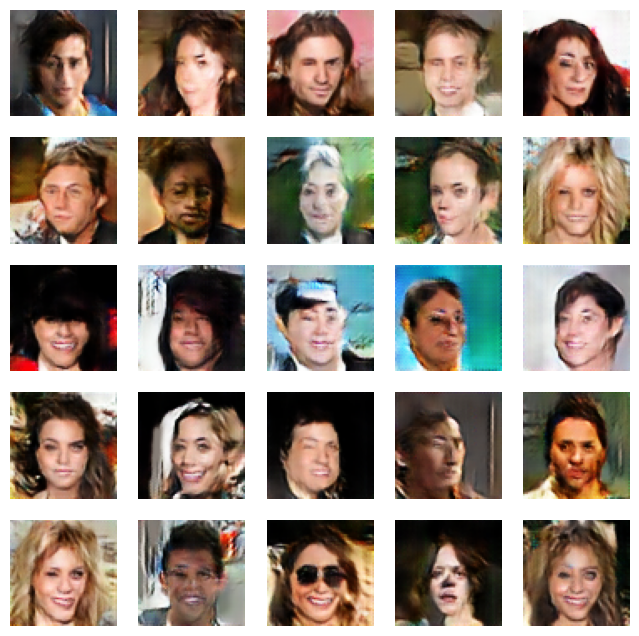

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3643 - g_loss: 0.7760
Epoch 32/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3682 - g_loss: 0.7668
Epoch 33/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3728 - g_loss: 0.7686
Epoch 34/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3677 - g_loss: 0.7757
Epoch 35/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3633 - g_loss: 0.7754
Epoch 36/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3629 - g_loss: 0.7823
Epoch 37/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3641 - g_loss: 0.7844
Epoch 38/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3647 - g_loss: 0.7857
Epoch 39/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3587 - g_loss: 0.7992
Epoch 40/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3531 - g_loss: 0.8000
Epoch 41/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - d_loss: 1.3535 - g_loss: 0.8073

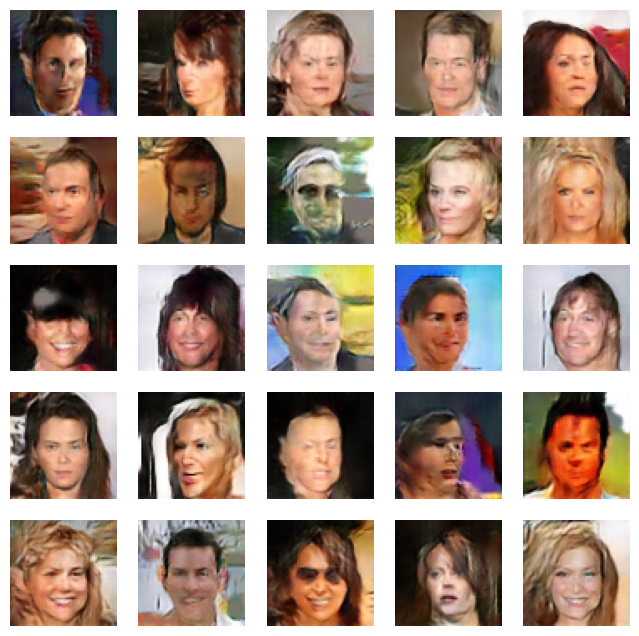

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 143s 91ms/step - d_loss: 1.3535 - g_loss: 0.8073
Epoch 42/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3478 - g_loss: 0.8172
Epoch 43/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 142s 91ms/step - d_loss: 1.3559 - g_loss: 0.8068
Epoch 44/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3532 - g_loss: 0.8144
Epoch 45/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3540 - g_loss: 0.8220
Epoch 46/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3406 - g_loss: 0.8322
Epoch 47/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3431 - g_loss: 0.8338
Epoch 48/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3480 - g_loss: 0.8351
Epoch 49/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 91ms/step - d_loss: 1.3276 - g_loss: 0.8588
Epoch 50/50
1563/1563 ━━━━━━━━━━━━━━━━━━━━ 141s 90ms/step - d_loss: 1.3334 - g_loss: 0.8640


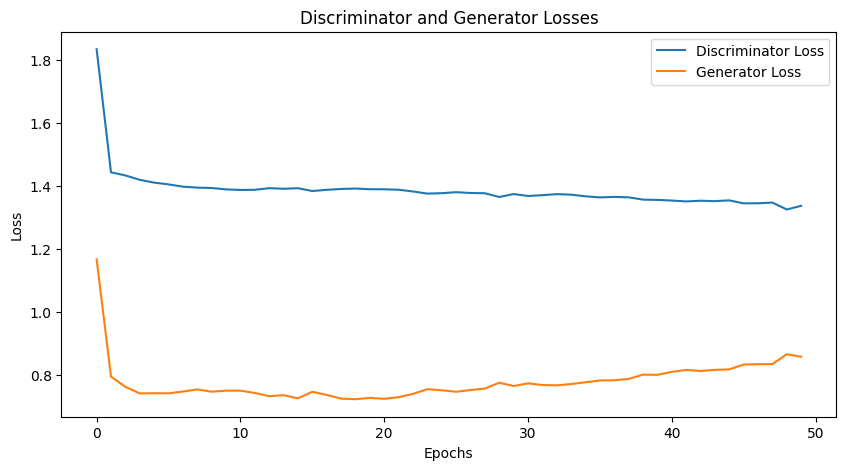

minimum value of d_loss = 1.325143814086914 for epoch  48   
minimum value of g_loss = 0.7227808833122253 for epoch  18   
minimum value of total = 2.113315999507904 for epoch  20   


In [20]:
N_EPOCHS = 50
dcgan2.fit(train_images, epochs=N_EPOCHS, callbacks=[DCGANMonitor(DCGAN)])

### First model graph and error
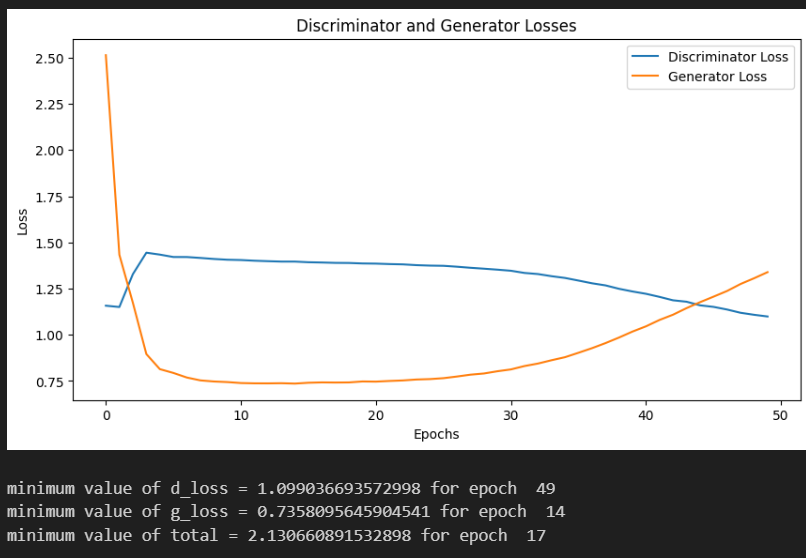
### Second model graph and error
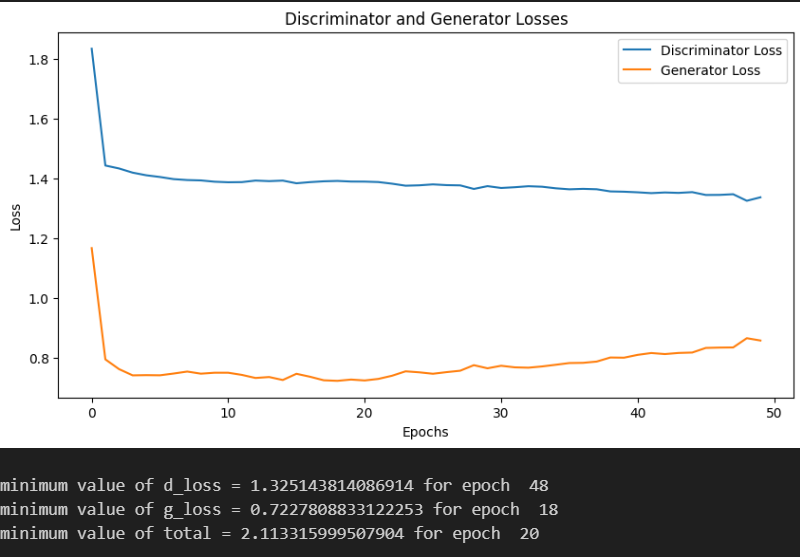

## Generate New Anime Image

## First model image 

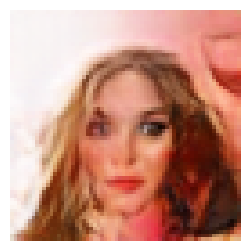

In [21]:
noise = tf.random.normal([1, 200])
fig = plt.figure(figsize=(3, 3))
g_img = dcgan.generator(noise)
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.show()

## Second model image

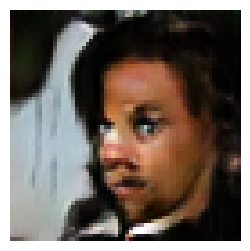

In [22]:
noise = tf.random.normal([1, 200])
fig = plt.figure(figsize=(3, 3))
g_img = dcgan2.generator(noise)
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
plt.show()

### After manually generating outputs by loading the .h5 file into the model, the results were promising and aligned well with our expectations.

## First model images

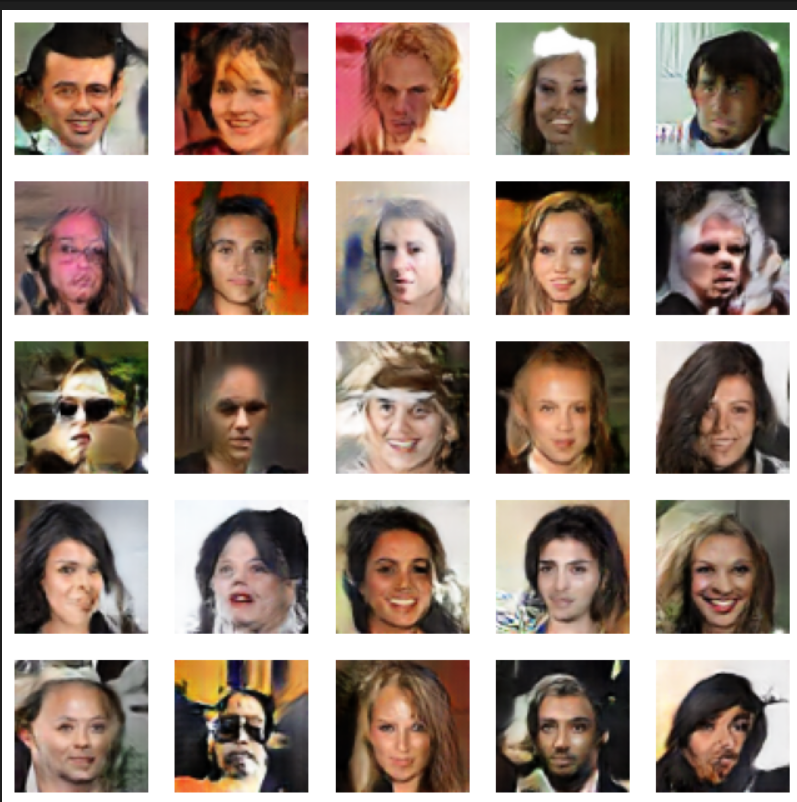

## Second model images

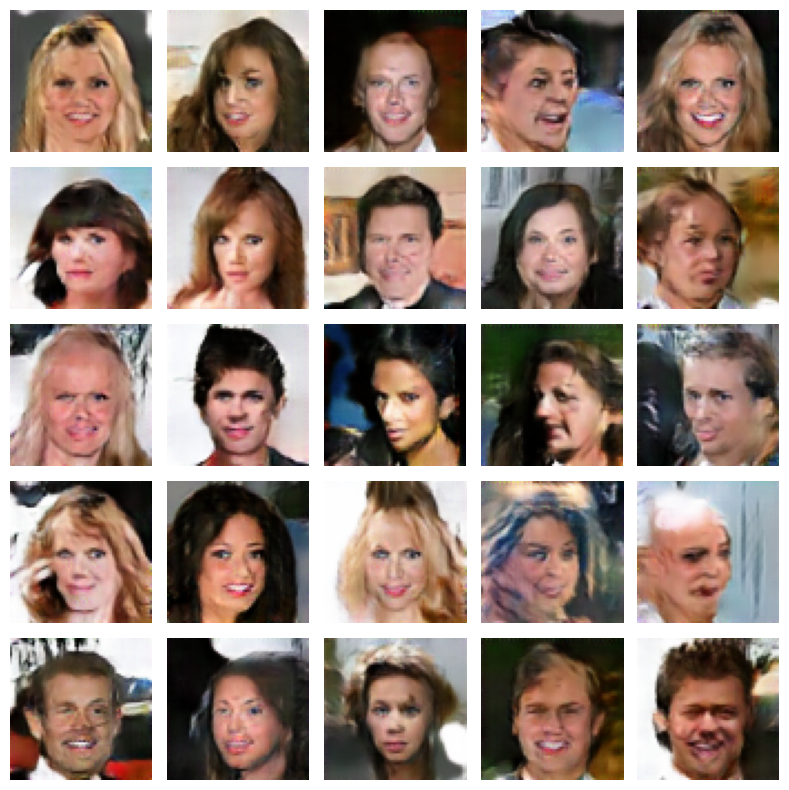


## The second model's images show slight improvement over the first, as they exhibit less blurriness. Perhaps after 100 or 200 epochs, both models will significantly enhance their image quality.

## tilt faces are good in second model 

## Comment
### Despite my efforts, I was unable to reduce the error rate by 5%. However, I did manage to improve it by around 1-2%. Additionally, the image quality appears to have noticeably enhanced. Due to time constraints, I limited training to 50 epochs, as this notebook takes approximately 4 hours to train on a Kaggle GPU.